In [1]:
from pathlib import Path
from functools import partial
import dotenv
import pytorch_lightning as pl
import torch
from matplotlib import pyplot as plt
from pytorch_lightning.callbacks import ModelCheckpoint, RichProgressBar

from inz.data.data_module import XBDDataModule
from inz.data.event import Event, Tier3, Tier1, Hold, Test
from inz.models.baseline_module import BaselineModule
from inz.util import get_loc_cls_weights, get_wandb_logger, show_masks_comparison
from inz.xview2_strong_baseline.legacy.losses import ComboLoss
from inz.xview2_strong_baseline.legacy.zoo.models import Res34_Unet_Double
from inz.models.baseline_module import BaselineModule
import torch.nn as nn
import torch.nn.functional as F

from torchmetrics.functional.classification import multiclass_f1_score
from torchmetrics.functional.classification import binary_accuracy

In [2]:
import sys  # noqa: I001

sys.path.append("inz/revgrad")

from utils import GradientReversal

sys.path.append("inz/xview2_strong_baseline")

from legacy.zoo.models import Res34_Unet_Double

In [3]:
dotenv.load_dotenv()
RANDOM_SEED = 123
pl.seed_everything(RANDOM_SEED)
device = torch.device("cuda")
torch.set_float32_matmul_precision("high")

Seed set to 123


In [4]:
BATCH_SIZE = 6

source_events = {
    Tier1: [
        Event.hurricane_michael,
        Event.hurricane_florence
    ],
    Test: [
        Event.hurricane_michael,
        Event.hurricane_florence
    ],
    Hold: [
        Event.hurricane_michael,
        Event.hurricane_florence
    ],
    Tier3: [
        Event.tuscaloosa_tornado,
        # Event.joplin_tornado,
        Event.moore_tornado
    ],
}

target_events={
    # Tier1: [
    #     Event.hurricane_harvey,
    # ],
    # Test: [
    #     Event.hurricane_harvey,
    # ],
    # Hold: [
    #     Event.hurricane_harvey,
    # ],
    Tier3: [
        Event.joplin_tornado,
        # Event.nepal_flooding
    ]
}

dm1 = XBDDataModule(
    path=Path("data/xBD_processed_512"),
    drop_unclassified_channel=True,
    events=source_events,
    val_fraction=0.15,
    test_fraction=0.0,
    train_batch_size=BATCH_SIZE,
    val_batch_size=BATCH_SIZE,
    test_batch_size=BATCH_SIZE,
)
dm1.prepare_data()
dm1.setup("fit")
dm2 = XBDDataModule(
    path=Path("data/xBD_processed_512"),
    drop_unclassified_channel=True,
    events=target_events,
    val_fraction=0.15,
    test_fraction=0.0,
    train_batch_size=BATCH_SIZE,
    val_batch_size=BATCH_SIZE,
    test_batch_size=BATCH_SIZE,
)
dm2.prepare_data()
dm2.setup("fit")

print(f"{len(dm1.train_dataloader())} train batches, {len(dm1.val_dataloader())} val batches")

945 train batches, 167 val batches


In [5]:
MODEL_CKPT = "/home/tomek/inz/inz/outputs/split_wind_test_hurricane_matthew_baseline/2024-11-06_05-02-23/checkpoints/experiment_name-0-epoch-79-step-9600-f1-0.601407-last.ckpt"

In [6]:
CLASS_WEIGHTS = torch.Tensor([0.01, 1., 9.0478803, 8.68207691, 12.9632271])
# CLASS_WEIGHTS = torch.Tensor([0.001, 0.01, 0., 0., 12.9632271])

In [7]:
model = BaselineModule.load_from_checkpoint(
    checkpoint_path=MODEL_CKPT,
    model=Res34_Unet_Double(pretrained=True),
    loss=ComboLoss(weights={"dice": 1, "focal": 1}),
    optimizer_factory=partial(torch.optim.AdamW, lr=0.0002, weight_decay=1e-6),
    scheduler_factory=partial(
        torch.optim.lr_scheduler.MultiStepLR,
        gamma=0.5,
        milestones=[5, 11, 17, 23, 29, 33, 47, 50, 60, 70, 90, 110, 130, 150, 170, 180, 190],
    ),
    class_weights=CLASS_WEIGHTS,
).to(device)
model.class_weights = model.class_weights.to(device)

using weights from ResNet34_Weights.IMAGENET1K_V1


In [8]:
class EncoderWrapper(torch.nn.Module):
    def __init__(self, enc_layers: list[torch.nn.Module]) -> None:
        super().__init__()
        self.conv1, self.conv2, self.conv3, self.conv4, self.conv5 = enc_layers

    # def forward(self, x):
    #     return (self._encode_once(x[:, :3, ...]), self._encode_once(x[:, 3:, ...]))
    #     # return torch.cat([torch.flatten(y, start_dim=1) for y in outputs])

    def forward(self, x):
        enc1 = self.conv1(x)
        enc2 = self.conv2(enc1)
        enc3 = self.conv3(enc2)
        enc4 = self.conv4(enc3)
        enc5 = self.conv5(enc4)
        return [enc1, enc2, enc3, enc4, enc5]

In [9]:
class DecoderWrapper(torch.nn.Module):
    def __init__(self, dec_layers: list[torch.nn.Module], outconv: torch.nn.Module) -> None:
        super().__init__()
        (
            self.conv6,
            self.conv6_2,
            self.conv7,
            self.conv7_2,
            self.conv8,
            self.conv8_2,
            self.conv9,
            self.conv9_2,
            self.conv10,
        ) = dec_layers
        self.res = outconv

    def forward(self, x1, x2):
        enc1_1, enc2_1, enc3_1, enc4_1, enc5_1 = x1
        enc1_2, enc2_2, enc3_2, enc4_2, enc5_2 = x2
        return self._forward(enc1_1, enc2_1, enc3_1, enc4_1, enc5_1, enc1_2, enc2_2, enc3_2, enc4_2, enc5_2)

    def _forward(self, enc1_1, enc2_1, enc3_1, enc4_1, enc5_1, enc1_2, enc2_2, enc3_2, enc4_2, enc5_2):
        output1 = self._decode_once(enc1_1, enc2_1, enc3_1, enc4_1, enc5_1)
        output2 = self._decode_once(enc1_2, enc2_2, enc3_2, enc4_2, enc5_2)
        return self.res(torch.cat([output1, output2], 1))

    def _decode_once(self, enc1, enc2, enc3, enc4, enc5):
        dec6 = self.conv6(F.interpolate(enc5, scale_factor=2))
        dec6 = self.conv6_2(torch.cat([dec6, enc4], 1))
        dec7 = self.conv7(F.interpolate(dec6, scale_factor=2))
        dec7 = self.conv7_2(torch.cat([dec7, enc3], 1))
        dec8 = self.conv8(F.interpolate(dec7, scale_factor=2))
        dec8 = self.conv8_2(torch.cat([dec8, enc2], 1))
        dec9 = self.conv9(F.interpolate(dec8, scale_factor=2))
        dec9 = self.conv9_2(torch.cat([dec9, enc1], 1))
        dec10 = self.conv10(F.interpolate(dec9, scale_factor=2))
        return dec10

In [10]:
feature_extractor = EncoderWrapper(
    enc_layers=[
        model.model.conv1,
        model.model.conv2,
        model.model.conv3,
        model.model.conv4,
        model.model.conv5,
    ]
)

decoder = DecoderWrapper(
    dec_layers=[
        model.model.conv6,
        model.model.conv6_2,
        model.model.conv7,
        model.model.conv7_2,
        model.model.conv8,
        model.model.conv8_2,
        model.model.conv9,
        model.model.conv9_2,
        model.model.conv10,
    ],
    outconv=model.model.res,
)


In [11]:
from torch.nn.modules import Module

REVERSAL_LAMBDA = 1


class DecoderDiscriminator(DecoderWrapper):
    def __init__(self, dec_layers: list[Module], outconv: Module) -> None:
        super().__init__(dec_layers, outconv)
        self.revgrad = GradientReversal(lambda_=REVERSAL_LAMBDA)
        self.res = nn.Sequential(outconv, nn.Flatten(), nn.Linear(5 * 512**2, 1))

    def forward(self, x1, x2):
        enc1_1, enc2_1, enc3_1, enc4_1, enc5_1 = x1
        enc1_2, enc2_2, enc3_2, enc4_2, enc5_2 = x2
        return super()._forward(
            self.revgrad(enc1_1),
            self.revgrad(enc2_1),
            self.revgrad(enc3_1),
            self.revgrad(enc4_1),
            self.revgrad(enc5_1),
            self.revgrad(enc1_2),
            self.revgrad(enc2_2),
            self.revgrad(enc3_2),
            self.revgrad(enc4_2),
            self.revgrad(enc5_2),
        )


discriminator_base = BaselineModule(
    model=Res34_Unet_Double(pretrained=True),
    loss=ComboLoss(weights={"dice": 1, "focal": 1}),
    optimizer_factory=partial(torch.optim.AdamW, lr=0.0002, weight_decay=1e-6),
    scheduler_factory=partial(
        torch.optim.lr_scheduler.MultiStepLR,
        gamma=0.5,
        milestones=[5, 11, 17, 23, 29, 33, 47, 50, 60, 70, 90, 110, 130, 150, 170, 180, 190],
    ),
    class_weights=CLASS_WEIGHTS,
)

discriminator = DecoderDiscriminator(
    dec_layers=[
        discriminator_base.model.conv6,
        discriminator_base.model.conv6_2,
        discriminator_base.model.conv7,
        discriminator_base.model.conv7_2,
        discriminator_base.model.conv8,
        discriminator_base.model.conv8_2,
        discriminator_base.model.conv9,
        discriminator_base.model.conv9_2,
        discriminator_base.model.conv10,
    ],
    outconv=discriminator_base.model.res,
).to(device)

using weights from ResNet34_Weights.IMAGENET1K_V1


In [12]:
source_loader = dm1.train_dataloader()
target_loader = dm2.train_dataloader()
optim = torch.optim.AdamW(list(discriminator.parameters()) + list(model.parameters()), lr=0.0000005, weight_decay=1e-7)
# optim = torch.optim.AdamW(list(discriminator.parameters()) + list(model.parameters()), lr=0.0002, weight_decay=1e-6)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optim,
    gamma=0.5,
    milestones=[
        5,
        11,
        17,
        23,
        29,
        33,
        47,
        50,
        60,
        70,
        90,
        110,
        130,
        150,
        170,
        180,
        190,
    ],
)

https://arxiv.org/abs/1409.7495
https://github.com/jvanvugt/pytorch-domain-adaptation/blob/master/revgrad.py


In [13]:
from tqdm.auto import tqdm
from itertools import islice

EPOCHS = 40

DOMAIN_LOSS_FACTOR = 1
LABEL_LOSS_FACTOR = 1

for epoch in range(1, EPOCHS + 1):
    batches = zip(source_loader, target_loader)
    n_batches = min(len(source_loader), len(target_loader)) - 1

    total_domain_loss = total_label_loss = total_label_f1_source = total_label_f1_target = (
        total_discriminator_accuracy
    ) = 0
    total_label_f1_source_class = torch.Tensor([0., 0., 0., 0., 0.]).to(device)
    total_label_f1_target_class = torch.Tensor([0., 0., 0., 0., 0.]).to(device)
    for step, ((source_batch), (target_batch)) in enumerate(
        tqdm(islice(batches, n_batches), total=n_batches, position=0, leave=True), start=1
    ):
        s_img_pre, s_mask_pre, s_img_post, s_mask_post = source_batch
        t_img_pre, t_mask_pre, t_img_post, t_mask_post = target_batch

        img_source = torch.cat([s_img_pre, s_img_post], dim=1).to(device)
        img_target = torch.cat([s_img_pre, s_img_post], dim=1).to(device)

        domain_y = torch.cat([torch.ones(img_source.shape[0]), torch.zeros(img_target.shape[0])])
        domain_y = domain_y.to(device)
        label_y = s_mask_post.to(device)

        features_source_pre = feature_extractor(s_img_pre.to(device))
        features_source_post = feature_extractor(s_img_post.to(device))
        features_target_pre = feature_extractor(t_img_pre.to(device))
        features_target_post = feature_extractor(t_img_post.to(device))

        features_source_flat = torch.cat(
            (
                torch.cat([t.flatten(start_dim=1) for t in features_source_pre], dim=1),
                torch.cat([t.flatten(start_dim=1) for t in features_source_post], dim=1),
            ),
            dim=1,
        )
        features_target_flat = torch.cat(
            (
                torch.cat([t.flatten(start_dim=1) for t in features_target_pre], dim=1),
                torch.cat([t.flatten(start_dim=1) for t in features_target_post], dim=1),
            ),
            dim=1,
        )

        features_cat = torch.cat((features_source_flat, features_target_flat))

        domain_preds_source = discriminator(features_source_pre, features_source_post)
        domain_preds_target = discriminator(features_target_pre, features_target_post)

        domain_preds = torch.cat((domain_preds_source, domain_preds_target)).squeeze()

        label_preds = decoder(features_source_pre, features_source_post)

        domain_loss = F.binary_cross_entropy_with_logits(domain_preds, domain_y)

        label_loss = torch.stack(
            [
                model.loss_fn(label_preds[:, i, ...], label_y.to(torch.float)[:, i, ...])
                for i in range(label_preds.shape[1])
            ]
        )
        label_loss = label_loss.dot(model.class_weights).sum()

        loss = domain_loss + label_loss

        optim.zero_grad()
        loss.backward()
        optim.step()

        total_domain_loss += domain_loss.item()
        total_label_loss += label_loss.item()
        label_f1_source = multiclass_f1_score(label_preds.argmax(dim=1), label_y.argmax(dim=1), num_classes=5)
        total_label_f1_source += label_f1_source

        label_f1_source_class = multiclass_f1_score(label_preds.argmax(dim=1), label_y.argmax(dim=1), num_classes=5, average='none')
        total_label_f1_source_class += label_f1_source_class

        discriminator_accuracy = binary_accuracy(domain_preds, domain_y)
        total_discriminator_accuracy += discriminator_accuracy

        with torch.no_grad():
            label_preds_target = decoder(features_target_pre, features_target_post)
            label_f1_target = multiclass_f1_score(
                label_preds_target.argmax(dim=1), t_mask_post.to(device).argmax(dim=1), num_classes=5
            )
            total_label_f1_target += label_f1_target

            label_f1_target_class = multiclass_f1_score(
                label_preds_target.argmax(dim=1), t_mask_post.to(device).argmax(dim=1), num_classes=5, average='none'
            )
            total_label_f1_target_class += label_f1_target_class

        tqdm.write(
            f"STEP {(epoch-1) * BATCH_SIZE + step:03d}: domain_loss={domain_loss.item():.4f}, label_loss={label_loss.item():.4f}, "
            f"source_f1={label_f1_source:.4f}, "
            f"target_f1={label_f1_target:.4f}, "
            f"discriminator_accuracy={discriminator_accuracy:.4f}"
            f"\nsource_f1_class={label_f1_source_class}"
            f"\ntarget_f1_class={label_f1_target_class}"
        )

    scheduler.step()

    mean_domain_loss = total_domain_loss / n_batches
    mean_label_loss = total_label_loss / n_batches
    mean_f1_source = total_label_f1_source / n_batches
    mean_f1_target = total_label_f1_target / n_batches
    mean_f1_source_class = total_label_f1_source_class / n_batches
    mean_f1_target_class = total_label_f1_target_class / n_batches
    mean_discriminator_accuracy = total_discriminator_accuracy / n_batches
    tqdm.write(
        f"############## EPOCH {epoch:03d}: domain_loss={mean_domain_loss:.4f}, label_loss={mean_label_loss:.4f}, "
        f"source_f1={mean_f1_source:.4f}, "
        f"target_f1={mean_f1_target:.4f}, "
        f"discriminator_accuracy={mean_discriminator_accuracy:.4f}"
        f"\nsource_f1_class={mean_f1_source_class}"
        f"\ntarget_f1_class={mean_f1_target_class}"
    )

  0%|          | 0/84 [00:00<?, ?it/s]

STEP 001: domain_loss=0.6863, label_loss=27.5387, source_f1=0.5707, target_f1=0.7023, discriminator_accuracy=0.5000
source_f1_class=tensor([0.9874, 0.7878, 0.5075, 0.0000, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9859, 0.7402, 0.5574, 0.6442, 0.5837], device='cuda:0')
STEP 002: domain_loss=0.6812, label_loss=10.3073, source_f1=0.8003, target_f1=0.8350, discriminator_accuracy=0.7500
source_f1_class=tensor([0.9829, 0.8567, 0.7512, 0.5855, 0.8252], device='cuda:0')
target_f1_class=tensor([0.9894, 0.8903, 0.7987, 0.7101, 0.7866], device='cuda:0')
STEP 003: domain_loss=0.6932, label_loss=22.9325, source_f1=0.5327, target_f1=0.7508, discriminator_accuracy=0.4167
source_f1_class=tensor([0.9909, 0.6421, 0.4837, 0.5469, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9842, 0.7895, 0.7867, 0.4996, 0.6941], device='cuda:0')
STEP 004: domain_loss=0.6901, label_loss=23.5721, source_f1=0.5607, target_f1=0.8932, discriminator_accuracy=0.5833
source_f1_class=tensor([0.9880, 0.7889, 0.67

  0%|          | 0/84 [00:00<?, ?it/s]

STEP 007: domain_loss=0.6705, label_loss=25.4965, source_f1=0.5037, target_f1=0.6752, discriminator_accuracy=0.5833
source_f1_class=tensor([0.9917, 0.8433, 0.6837, 0.0000, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9844, 0.6911, 0.5585, 0.4342, 0.7080], device='cuda:0')
STEP 008: domain_loss=0.6427, label_loss=24.5630, source_f1=0.6264, target_f1=0.8290, discriminator_accuracy=0.5833
source_f1_class=tensor([0.9848, 0.7437, 0.3471, 0.4299, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9834, 0.7662, 0.6885, 0.8678, 0.8392], device='cuda:0')
STEP 009: domain_loss=0.6838, label_loss=24.2874, source_f1=0.5235, target_f1=0.7174, discriminator_accuracy=0.5833
source_f1_class=tensor([0.9877, 0.8529, 0.0000, 0.7769, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9746, 0.8417, 0.6763, 0.4725, 0.6221], device='cuda:0')
STEP 010: domain_loss=0.6232, label_loss=26.7487, source_f1=0.4784, target_f1=0.7586, discriminator_accuracy=0.7500
source_f1_class=tensor([0.9946, 0.8541, 0.54

  0%|          | 0/84 [00:00<?, ?it/s]

STEP 013: domain_loss=0.6003, label_loss=31.1268, source_f1=0.4239, target_f1=0.8343, discriminator_accuracy=0.7500
source_f1_class=tensor([0.9974, 0.6982, 0.0000, 0.0000, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9866, 0.8182, 0.8880, 0.6968, 0.7818], device='cuda:0')
STEP 014: domain_loss=0.5584, label_loss=26.2357, source_f1=0.4579, target_f1=0.7628, discriminator_accuracy=0.8333
source_f1_class=tensor([0.9862, 0.6986, 0.6045, 0.0000, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9763, 0.7477, 0.6075, 0.7403, 0.7421], device='cuda:0')
STEP 015: domain_loss=0.5497, label_loss=16.3308, source_f1=0.6892, target_f1=0.8168, discriminator_accuracy=0.9167
source_f1_class=tensor([0.9824, 0.7249, 0.6959, 0.8357, 0.2070], device='cuda:0')
target_f1_class=tensor([0.9855, 0.8711, 0.6944, 0.6810, 0.8518], device='cuda:0')
STEP 016: domain_loss=0.5727, label_loss=12.4886, source_f1=0.7274, target_f1=0.7650, discriminator_accuracy=0.6667
source_f1_class=tensor([0.9961, 0.7696, 0.58

  0%|          | 0/84 [00:00<?, ?it/s]

STEP 019: domain_loss=0.6091, label_loss=23.0850, source_f1=0.6894, target_f1=0.7319, discriminator_accuracy=0.7500
source_f1_class=tensor([0.9792, 0.7730, 0.3676, 0.6376, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9863, 0.7194, 0.6027, 0.6508, 0.7003], device='cuda:0')
STEP 020: domain_loss=0.4324, label_loss=26.2504, source_f1=0.4609, target_f1=0.6943, discriminator_accuracy=0.9167
source_f1_class=tensor([0.9941, 0.7498, 0.5608, 0.0000, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9829, 0.7586, 0.7216, 0.3054, 0.7029], device='cuda:0')
STEP 021: domain_loss=0.7134, label_loss=24.4538, source_f1=0.5299, target_f1=0.4154, discriminator_accuracy=0.4167
source_f1_class=tensor([0.9845, 0.8320, 0.4614, 0.3716, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9906, 0.8027, 0.2839, 0.0000, 0.0000], device='cuda:0')
STEP 022: domain_loss=0.5173, label_loss=12.4094, source_f1=0.7323, target_f1=0.7074, discriminator_accuracy=0.7500
source_f1_class=tensor([0.9904, 0.8064, 0.62

  0%|          | 0/84 [00:00<?, ?it/s]

STEP 025: domain_loss=0.2641, label_loss=16.3894, source_f1=0.6974, target_f1=0.6908, discriminator_accuracy=1.0000
source_f1_class=tensor([0.9937, 0.8321, 0.6070, 0.8443, 0.2099], device='cuda:0')
target_f1_class=tensor([0.9827, 0.8358, 0.8190, 0.6262, 0.1906], device='cuda:0')
STEP 026: domain_loss=0.3159, label_loss=9.8553, source_f1=0.7286, target_f1=0.6563, discriminator_accuracy=1.0000
source_f1_class=tensor([0.9936, 0.6846, 0.4788, 0.6001, 0.8859], device='cuda:0')
target_f1_class=tensor([0.9633, 0.6686, 0.5445, 0.3272, 0.7781], device='cuda:0')
STEP 027: domain_loss=0.5934, label_loss=18.5680, source_f1=0.8128, target_f1=0.6728, discriminator_accuracy=0.7500
source_f1_class=tensor([0.9842, 0.8016, 0.4872, 0.9782, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9636, 0.6494, 0.6482, 0.6001, 0.5028], device='cuda:0')
STEP 028: domain_loss=0.4465, label_loss=9.6064, source_f1=0.7800, target_f1=0.7318, discriminator_accuracy=0.9167
source_f1_class=tensor([0.9960, 0.7458, 0.4463

  0%|          | 0/84 [00:00<?, ?it/s]

STEP 031: domain_loss=0.2774, label_loss=25.2827, source_f1=0.4700, target_f1=0.8843, discriminator_accuracy=0.9167
source_f1_class=tensor([0.9942, 0.6908, 0.0000, 0.6649, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9880, 0.8633, 0.6812, 0.9537, 0.9354], device='cuda:0')
STEP 032: domain_loss=0.1753, label_loss=12.6420, source_f1=0.7077, target_f1=0.6717, discriminator_accuracy=1.0000
source_f1_class=tensor([0.9935, 0.8716, 0.7259, 0.0000, 0.9477], device='cuda:0')
target_f1_class=tensor([0.9845, 0.8670, 0.5536, 0.4065, 0.5469], device='cuda:0')
STEP 033: domain_loss=0.2028, label_loss=23.4671, source_f1=0.6728, target_f1=0.8074, discriminator_accuracy=1.0000
source_f1_class=tensor([0.9936, 0.8252, 0.4702, 0.4022, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9820, 0.7986, 0.7544, 0.7029, 0.7993], device='cuda:0')
STEP 034: domain_loss=0.2177, label_loss=31.2218, source_f1=0.4141, target_f1=0.6466, discriminator_accuracy=1.0000
source_f1_class=tensor([0.9988, 0.6576, 0.00

  0%|          | 0/84 [00:00<?, ?it/s]

STEP 037: domain_loss=0.2457, label_loss=14.4327, source_f1=0.6797, target_f1=0.6788, discriminator_accuracy=1.0000
source_f1_class=tensor([0.9850, 0.6077, 0.4136, 0.6918, 0.7004], device='cuda:0')
target_f1_class=tensor([0.9909, 0.8404, 0.3562, 0.4191, 0.7872], device='cuda:0')
STEP 038: domain_loss=0.1484, label_loss=18.4151, source_f1=0.5908, target_f1=0.7664, discriminator_accuracy=1.0000
source_f1_class=tensor([0.9905, 0.7527, 0.5423, 0.0069, 0.6615], device='cuda:0')
target_f1_class=tensor([0.9891, 0.7587, 0.6725, 0.5472, 0.8645], device='cuda:0')
STEP 039: domain_loss=0.3939, label_loss=16.1631, source_f1=0.6714, target_f1=0.7625, discriminator_accuracy=0.9167
source_f1_class=tensor([0.9888, 0.7544, 0.6089, 0.6450, 0.3598], device='cuda:0')
target_f1_class=tensor([0.9869, 0.5755, 0.6307, 0.8461, 0.7735], device='cuda:0')
STEP 040: domain_loss=0.6006, label_loss=27.8270, source_f1=0.3311, target_f1=0.7539, discriminator_accuracy=0.6667
source_f1_class=tensor([0.9863, 0.0463, 0.32

  0%|          | 0/84 [00:00<?, ?it/s]

STEP 043: domain_loss=0.2238, label_loss=22.4956, source_f1=0.5611, target_f1=0.6599, discriminator_accuracy=1.0000
source_f1_class=tensor([0.9893, 0.7577, 0.7511, 0.3073, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9767, 0.8387, 0.4124, 0.4400, 0.6319], device='cuda:0')
STEP 044: domain_loss=0.2187, label_loss=15.5192, source_f1=0.6403, target_f1=0.7287, discriminator_accuracy=1.0000
source_f1_class=tensor([0.9966, 0.4727, 0.6705, 0.5352, 0.5265], device='cuda:0')
target_f1_class=tensor([0.9818, 0.7247, 0.7370, 0.7271, 0.4727], device='cuda:0')
STEP 045: domain_loss=0.2058, label_loss=28.2368, source_f1=0.5656, target_f1=0.3577, discriminator_accuracy=1.0000
source_f1_class=tensor([0.9923, 0.8639, 0.4063, 0.0000, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9816, 0.0000, 0.1667, 0.1050, 0.5352], device='cuda:0')
STEP 046: domain_loss=0.2293, label_loss=30.9756, source_f1=0.3568, target_f1=0.8830, discriminator_accuracy=0.9167
source_f1_class=tensor([0.9949, 0.7890, 0.00

KeyboardInterrupt: 

In [ ]:
target_model = model
for attr in (
    "conv1", "conv2", "conv3", "conv4", "conv5"
):
    setattr(target_model.model, attr, getattr(feature_extractor, attr))
for attr in (
    "conv6", "conv6_2", "conv7", "conv7_2", "conv8", "conv8_2", "conv9", "conv9_2", "conv10"
):
    setattr(target_model.model, attr, getattr(decoder, attr))

target_model.model.res = decoder.res


target_model.eval()


BaselineModule(
  (model): Res34_Unet_Double(
    (conv6): ConvRelu(
      (layer): Sequential(
        (0): Conv2d(512, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
      )
    )
    (conv6_2): ConvRelu(
      (layer): Sequential(
        (0): Conv2d(576, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
      )
    )
    (conv7): ConvRelu(
      (layer): Sequential(
        (0): Conv2d(320, 160, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
      )
    )
    (conv7_2): ConvRelu(
      (layer): Sequential(
        (0): Conv2d(288, 160, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
      )
    )
    (conv8): ConvRelu(
      (layer): Sequential(
        (0): Conv2d(160, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
      )
    )
    (conv8_2): ConvRelu(
      (layer): Sequential(
        (0): C

In [ ]:
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

from torchvision.utils import draw_segmentation_masks, make_grid  # type: ignore[import-untyped]
import numpy as np
from PIL import Image


In [ ]:
class SemanticSegmentationTarget:
    def __init__(self, category, mask):
        self.category = category
        self.mask = mask
        if torch.cuda.is_available():
            self.mask = self.mask.cuda()

    def __call__(self, model_output):
        return (model_output[self.category, :, :] * self.mask).sum()

In [ ]:
dm_test = XBDDataModule(
    path=Path("data/xBD_processed_512"),
    drop_unclassified_channel=True,
    split_events={
        "test": target_events
    },
    train_batch_size=BATCH_SIZE,
    val_batch_size=BATCH_SIZE,
    test_batch_size=BATCH_SIZE,
)
dm_test.prepare_data()
dm_test.setup("test")

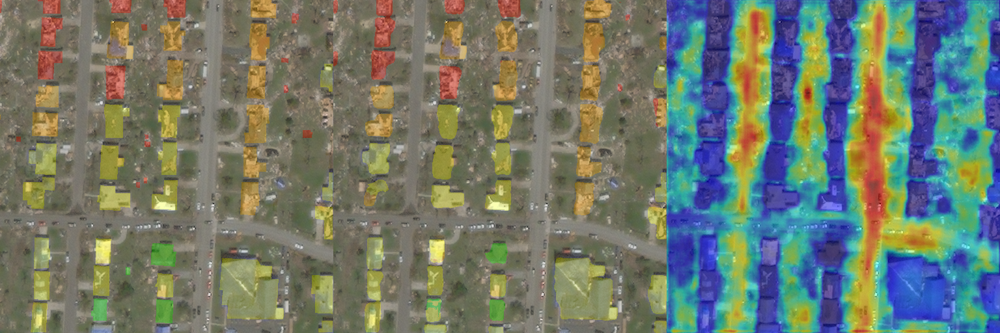

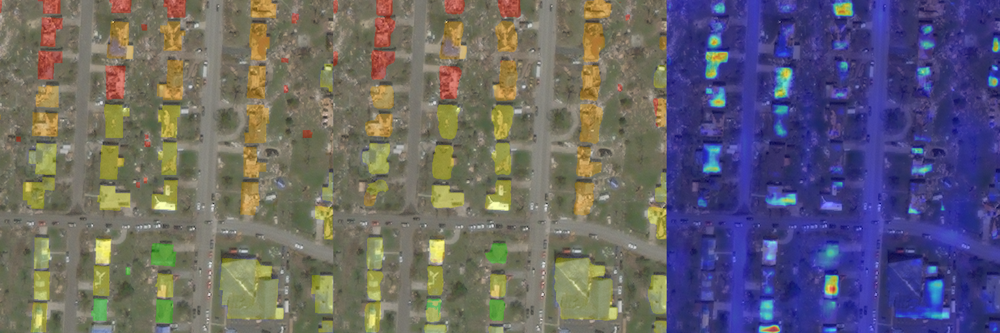

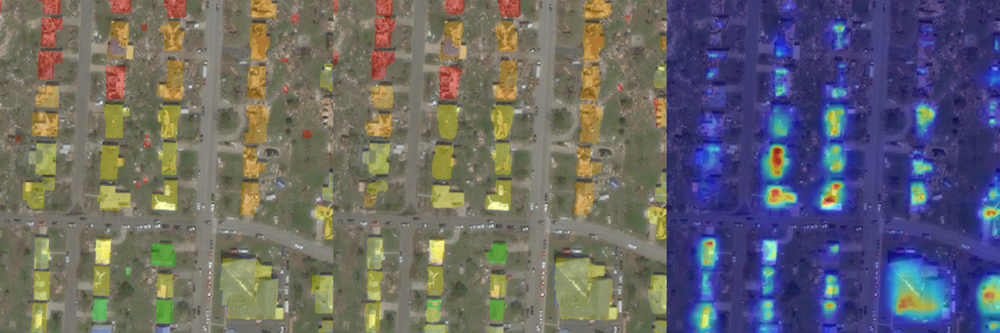

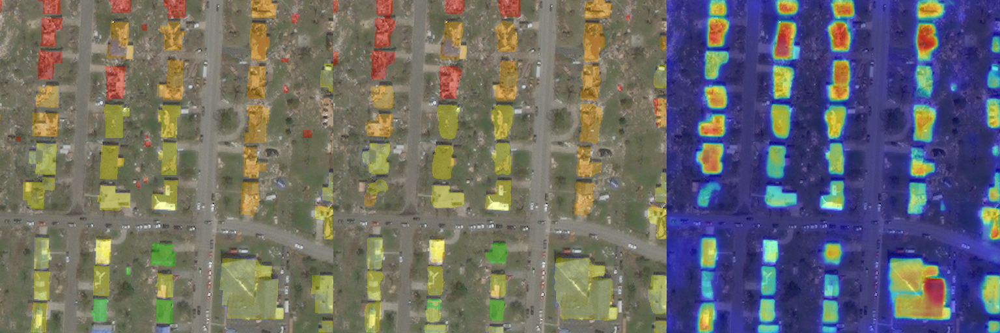

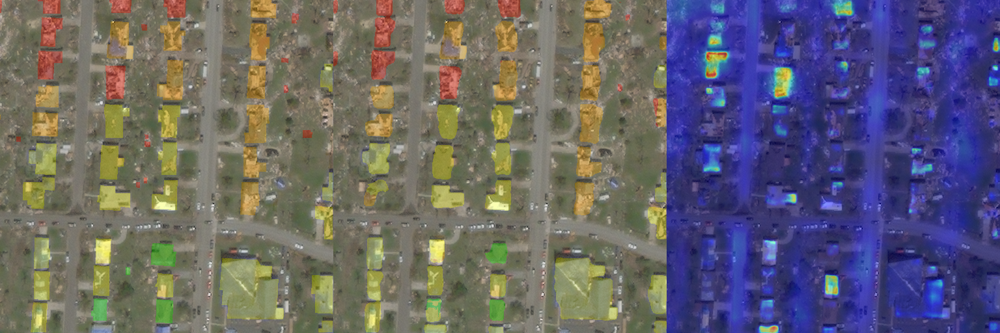

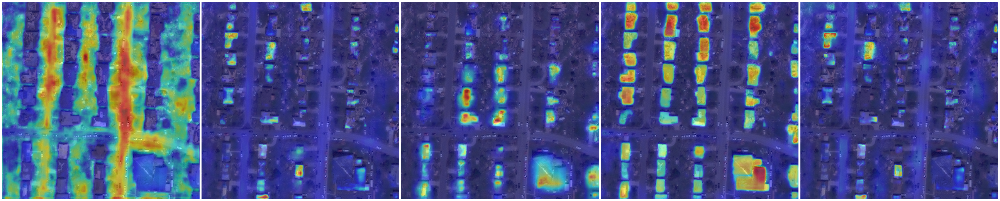

In [ ]:
# IMG_NAME = "hurricane-harvey_00000030_post_disaster_patch0"
IMG_NAME = "joplin-tornado_00000000_post_disaster_patch3"

IMG_PATH_POST = Path(f"data/xBD_processed_512/images/tier3/images/{IMG_NAME}.png")

# FarSeg
# target_layers = model.model.module.decoder.blocks

# Baseline
target_layers = [
    target_model.model.conv6_2,
    target_model.model.conv7_2,
    target_model.model.conv8_2,
    target_model.model.conv9_2,
    target_model.model.conv10,
    target_model.model.res,
]

# region boring
item = dm_test._test_dataset[dm_test._test_dataset._image_paths_post.index(IMG_PATH_POST)]
image_pre, mask_pre, image_post, mask_post = item

with torch.no_grad():
    m = target_model.to(device)
    preds = m(torch.cat([torch.unsqueeze(image_pre, 0), torch.unsqueeze(image_post, 0)], dim=1).to(device))

for c in range(0, 5):

    targets = [SemanticSegmentationTarget(c, mask_post.argmax(axis=0))]
    with GradCAM(
        model=target_model,
        target_layers=target_layers,
    ) as cam:
        grayscale_cam = cam(input_tensor=torch.unsqueeze(torch.cat([image_pre, image_post], dim=0), 0), targets=targets)[
            0, :
        ]
        cam_image = show_cam_on_image(
            ((image_post + 1) / 2).moveaxis(0, -1).detach().cpu().numpy(), grayscale_cam, use_rgb=True
        )

    colors = [
        (128, 128, 128),
        (0, 255, 0),
        (244, 255, 0),
        (255, 174, 0),
        (255, 0, 0),
        (255, 255, 255),
    ]
    preds_masks = draw_segmentation_masks(
        ((image_post + 1) * 127.5).to(torch.uint8), torch.nn.functional.one_hot(preds[0].argmax(dim=0), num_classes=5).moveaxis(-1, 0).to(bool), colors=colors, alpha=0.3
    )
    ground_truth_masks = draw_segmentation_masks(
        ((image_post + 1) * 127.5).to(torch.uint8), mask_post.to(bool), colors=colors, alpha=0.3
    )
    comp = np.hstack((ground_truth_masks.moveaxis(0, -1).detach().cpu().numpy(), preds_masks.moveaxis(0, -1).detach().cpu().numpy(), cam_image))
    display(Image.fromarray(comp))

acts = []
for c in range(0, 5):
    targets = [SemanticSegmentationTarget(c, mask_post.argmax(axis=0))]
    with GradCAM(
        model=target_model,
        target_layers=target_layers,
    ) as cam:
        grayscale_cam = cam(input_tensor=torch.unsqueeze(torch.cat([image_pre, image_post], dim=0), 0), targets=targets)[
            0, :
        ]
        cam_image = show_cam_on_image(
            ((image_post + 1) / 2).moveaxis(0, -1).detach().cpu().numpy(), grayscale_cam, use_rgb=True
        )

    acts.append(torch.from_numpy(cam_image).moveaxis(-1, 0))
comp_acts = make_grid(torch.stack(acts), padding=5, pad_value=255)
display(Image.fromarray(comp_acts.moveaxis(0, -1).numpy()))

# endregion

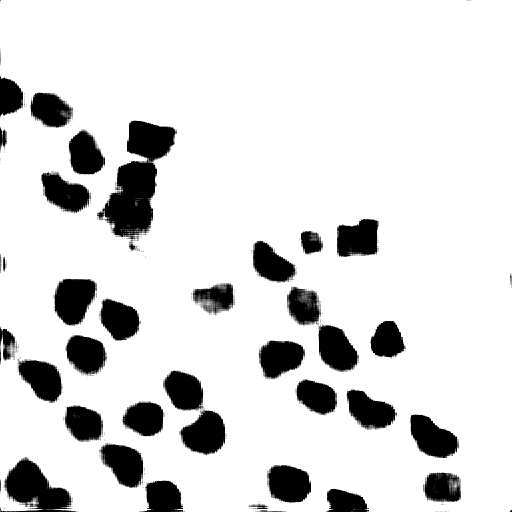

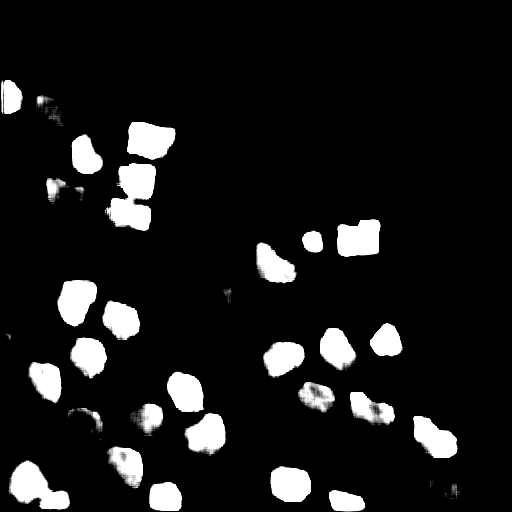

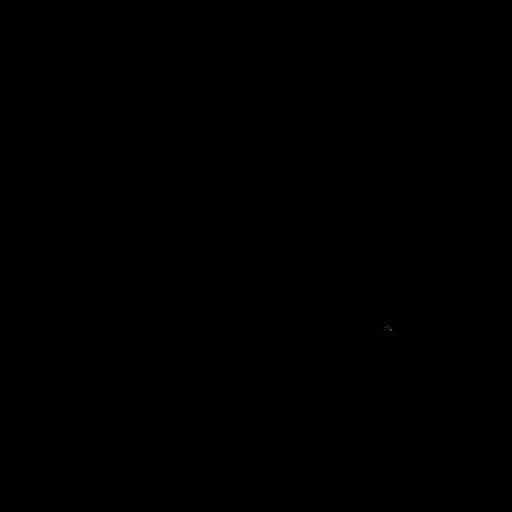

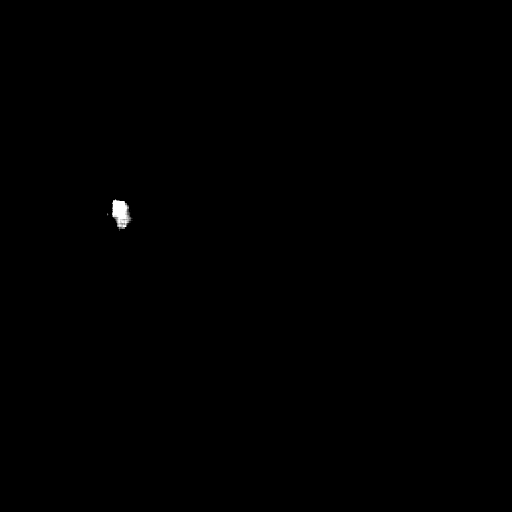

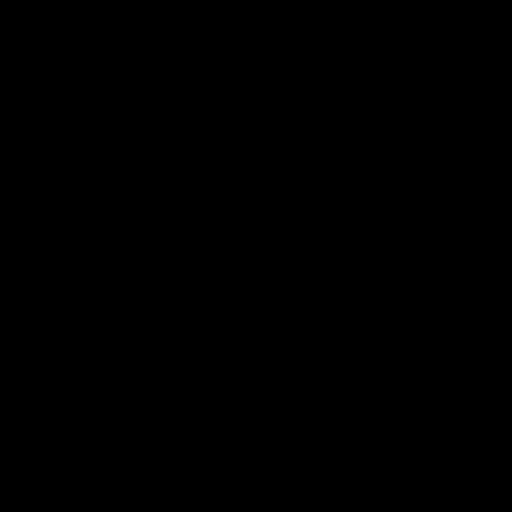

In [ ]:
for i in range(5):
    display(Image.fromarray(preds[0][i].moveaxis(0, -1).cpu().numpy() * 255).convert('L'))